In [45]:
import pandas as pd
import matplotlib.pyplot as plt
from wordcloud import WordCloud, STOPWORDS
import numpy as np
import seaborn
import plotly.express as px
from scipy.stats import zscore
from scipy import stats

In [2]:
# settings to display all columns
pd.set_option("display.max_columns", None)
ETF_Data = pd.read_csv('ETFs.csv', index_col = 0, low_memory = False)
MutualFund_Data = pd.read_csv('Mutual Funds.csv', index_col = 0, low_memory = False)

In [3]:
display (ETF_Data.head())
display (ETF_Data.info())
display (MutualFund_Data.head())
display (MutualFund_Data.info())

,fund_extended_name,fund_family,inception_date,category,investment_strategy,investment_type,size_type,currency,fund_net_annual_expense_ratio,category_net_annual_expense_ratio,asset_stocks,asset_bonds,price_earnings_ratio,price_book_ratio,price_sales_ratio,price_cashflow_ratio,sector_basic_materials,sector_consumer_cyclical,sector_financial_services,sector_real_estate,sector_consumer_defensive,sector_healthcare,sector_utilities,sector_communication_services,sector_energy,sector_industrials,sector_technology,credit_us_government,credit_aaa,credit_aa,credit_a,credit_bbb,credit_bb,credit_b,credit_below_b,credit_other_ratings,net_asset_value,fund_yield,top10_holdings,fund_return_ytd,category_return_ytd,fund_return_1month,category_return_1month,fund_return_3months,category_return_3months,fund_return_1year,category_return_1year,fund_return_3years,category_return_3years,fund_return_5years,category_return_5years,fund_return_10years,category_return_10years,fund_return_2019,category_return_2019,fund_return_2018,category_return_2018,fund_return_2017,category_return_2017,fund_return_2016,category_return_2016,fund_return_2015,category_return_2015,fund_return_2014,category_return_2014,fund_return_2013,category_return_2013,fund_return_2012,category_return_2012,fund_return_2011,category_return_2011,fund_return_2010,category_return_2010,years_up,years_down,fund_alpha_3years,category_alpha_3years,fund_alpha_5years,category_alpha_5years,fund_alpha_10years,category_alpha_10years,fund_beta_3years,category_beta_3years,fund_beta_5years,category_beta_5years,fund_beta_10years,category_beta_10years,fund_mean_annual_return_3years,category_mean_annual_return_3years,fund_mean_annual_return_5years,category_mean_annual_return_5years,fund_mean_annual_return_10years,category_mean_annual_return_10years,fund_r_squared_3years,category_r_squared_3years,fund_r_squared_5years,category_r_squared_5years,fund_r_squared_10years,category_r_squared_10years,fund_standard_deviation_3years,category_standard_deviation_3years,fund_standard_deviation_5years,category_standard_deviation_5years,fund_standard_deviation_10years,category_standard_deviation_10years,fund_sharpe_ratio_3years,category_sharpe_ratio_3years,fund_sharpe_ratio_5years,category_sharpe_ratio_5years,fund_sharpe_ratio_10years,category_sharpe_ratio_10years,fund_treynor_ratio_3years,category_treynor_ratio_3years,fund_treynor_ratio_5years,category_treynor_ratio_5years,fund_treynor_ratio_10years,category_treynor_ratio_10years
fund_symbol,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
1305,Daiwa ETF TOPIX,Daiwa Asset Management Co Ltd,2001-07-11,NaN,The investment seeks to track the price and yi...,Blend,Large,USD,0.00,NaN,100.00,0.0,12.92,1.18,0.81,5.41,7.81,17.26,11.73,3.19,9.44,7.05,1.96,4.95,1.7,20.29,14.61,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,4.010000e+12,1.84,"Toyota Motor Corp: 3.21, Mitsubishi UFJ Financ...",-6.62,NaN,1.22,NaN,-3.11,NaN,-5.17,NaN,3.83,NaN,7.86,NaN,9.25,NaN,NaN,NaN,NaN,NaN,22.06,NaN,0.17,NaN,11.90,NaN,10.12,NaN,54.10,NaN,20.69,NaN,-17.07,NaN,0.84,NaN,12,4,0.29,NaN,0.39,NaN,0.35,NaN,1.00,NaN,0.98,NaN,0.99,NaN,0.40,NaN,0.72,NaN,0.86,NaN,99.72,NaN,99.70,NaN,99.68,NaN,14.38,NaN,14.75,NaN,16.89,NaN,0.34,NaN,0.59,NaN,0.60,NaN,3.92,NaN,8.01,NaN,9.29,NaN
1306,Nomura TOPIX ETF,Nomura Asset Management Co Ltd,2001-07-11,NaN,The investment seeks to track the price and yi...,Blend,Large,USD,0.05,NaN,99.99,0.0,12.92,1.18,0.81,5.41,7.81,17.26,11.73,3.19,9.43,7.06,1.96,4.95,1.7,20.29,14.62,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,8.430000e+12,1.77,"Toyota Motor Corp: 3.14, TOPIX Futures 1812: 2...",-6.43,NaN,1.30,NaN,-3.10,NaN,-5.21,NaN,3.88,NaN,7.87,NaN,9.27,NaN,NaN,NaN,NaN,NaN,22.06,NaN,0.21,NaN,11.91,NaN,10.13,NaN,54.12,NaN,20.64,NaN,-17.04,NaN,0.93,NaN,12,4,0.31,NaN,0.40,NaN,0.38,NaN,1.00,NaN,0.98,NaN,0.98,NaN,0.41,NaN,0.72,NaN,0.86,NaN,99.72,NaN,99.69,NaN,99.68,NaN,14.38,NaN,14.75,NaN,16.83,NaN,0.34,NaN,0.59,NaN,0.61,NaN,3.94,NaN,8.03,NaN,9.33

<class 'pandas.core.frame.DataFrame'>
Index: 1680 entries, 1305 to ZROZ
Columns: 117 entries, fund_extended_name to category_treynor_ratio_10years
dtypes: float64(105), int64(2), object(10)
memory usage: 1.5+ MB


None

,fund_extended_name,fund_family,inception_date,category,rating,return_rating,risk_rating,investment_strategy,investment_type,size_type,currency,fund_net_annual_expense_ratio,category_net_annual_expense_ratio,asset_cash,asset_stocks,asset_bonds,asset_others,asset_preferred,asset_convertable,price_earnings_ratio,price_book_ratio,price_sales_ratio,price_cashflow_ratio,median_market_cap,sector_basic_materials,sector_consumer_cyclical,sector_financial_services,sector_real_estate,sector_consumer_defensive,sector_healthcare,sector_utilities,sector_communication_services,sector_energy,sector_industrials,sector_technology,bond_maturity,bond_duration,credit_us_government,credit_aaa,credit_aa,credit_a,credit_bbb,credit_bb,credit_b,credit_below_b,credit_other_ratings,net_asset_value,fund_yield,top10_holdings,fund_return_ytd,category_return_ytd,fund_return_1month,category_return_1month,fund_return_3months,category_return_3months,fund_return_1year,category_return_1year,fund_return_3years,category_return_3years,fund_return_5years,category_return_5years,fund_return_10years,category_return_10years,fund_return_2019,category_return_2019,fund_return_2018,category_return_2018,fund_return_2017,category_return_2017,fund_return_2016,category_return_2016,fund_return_2015,category_return_2015,fund_return_2014,category_return_2014,fund_return_2013,category_return_2013,fund_return_2012,category_return_2012,fund_return_2011,category_return_2011,fund_return_2010,category_return_2010,years_up,years_down,fund_return_2020_q3,fund_return_2020_q2,fund_return_2020_q1,fund_return_2019_q4,fund_return_2019_q3,fund_return_2019_q2,fund_return_2019_q1,fund_return_2018_q4,fund_return_2018_q3,fund_return_2018_q2,fund_return_2018_q1,fund_return_2017_q4,fund_return_2017_q3,fund_return_2017_q2,fund_return_2017_q1,fund_return_2016_q4,fund_return_2016_q3,fund_return_2016_q2,fund_return_2016_q1,fund_return_2015_q4,fund_return_2015_q3,fund_return_2015_q2,fund_return_2015_q1,fund_return_2014_q4,fund_return_2014_q3,fund_return_2014_q2,fund_return_2014_q1,fund_return_2013_q4,fund_return_2013_q3,fund_return_2013_q2,fund_return_2013_q1,fund_return_2012_q4,fund_return_2012_q3,fund_return_2012_q2,fund_return_2012_q1,fund_return_2011_q4,fund_return_2011_q3,fund_return_2011_q2,fund_return_2011_q1,fund_return_2010_q4,fund_return_2010_q3,fund_return_2010_q2,fund_return_2010_q1,quarters_up,quarters_down,fund_alpha_3years,category_alpha_3years,fund_alpha_5years,category_alpha_5years,fund_alpha_10years,category_alpha_10years,fund_beta_3years,category_beta_3years,fund_beta_5years,category_beta_5years,fund_beta_10years,category_beta_10years,fund_mean_annual_return_3years,category_mean_annual_return_3years,fund_mean_annual_return_5years,category_mean_annual_return_5years,fund_mean_annual_return_10years,category_mean_annual_return_10years,fund_r_squared_3years,category_r_squared_3years,fund_r_squared_5years,category_r_squared_5years,fund_r_squared_10years,category_r_squared_10years,fund_standard_deviation_3years,category_standard_deviation_3years,fund_standard_deviation_5years,category_standard_deviation_5years,fund_standard_deviation_10years,category_standard_deviation_10years,fund_sharpe_ratio_3years,category_sharpe_ratio_3years,fund_sharpe_ratio_5years,category_sharpe_ratio_5years,fund_sharpe_ratio_10years,category_sharpe_ratio_10years,fund_treynor_ratio_3years,category_treynor_ratio_3years,fund_treynor_ratio_5years,category_treynor_ratio_5years,fund_treynor_ratio_10years,category_treynor_ratio_10years
fund_symbol,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
AAAAX,DWS RREEF Real Assets Fund - Class A,DWS,2007-07-29,World Allocation,3.0,3.0,3.0,The investment seeks total return in excess of...,Blend,Large,USD,1.22,1.01,1.88,63.87,15.31,18.95,0.00,0.00,19.41,1.83,2.30,11.13,18592.11,13.52,1.62,0.00,42.97,1.54,0.00,15.29,1.67,11.53,11.87,0.00,4.70,4.27,NaN,NaN,NaN,NaN,N

<class 'pandas.core.frame.DataFrame'>
Index: 24821 entries, AAAAX to ZVNIX
Columns: 172 entries, fund_extended_name to category_treynor_ratio_10years
dtypes: float64(159), int64(2), object(11)
memory usage: 32.8+ MB


None

### Questions to ask from the data

-------------------------------------------------------------------------------------------------------------------------------------------------------

Q1. Keywords in investment strategy of top rated mutual funds

Q2: What has been the outperformance of Equities to Bonds

Q3. Sharpe and Treynor ratios of ETFs vs MFs i.e. Does being passive result in better performance ratios?

Q4. Are ratings able to predict category outperformance?

Q5. Are the assumptions of Fama French Model three-factor model still valid?
    - Do small caps outperform large caps?
    - Do value funds outperform growth funds?
  
Q6. higher expense ratio = higher alpha?

-------------------------------------------------------------------------------------------------------------------------------------------------------

## Data Clean Up based on Data We Need

In [4]:
MutualFund_Data = MutualFund_Data[MutualFund_Data.columns.drop(list(MutualFund_Data.filter(regex='sector_')))]
MutualFund_Data = MutualFund_Data[MutualFund_Data.columns.drop(list(MutualFund_Data.filter(regex='fund_return_20')))]
MutualFund_Data = MutualFund_Data[MutualFund_Data.columns.drop(list(MutualFund_Data.filter(regex='category_return_20')))]
MutualFund_Data = MutualFund_Data[MutualFund_Data.columns.drop(list(MutualFund_Data.filter(regex='price_')))]
MutualFund_Data = MutualFund_Data[MutualFund_Data.columns.drop(list(MutualFund_Data.filter(regex='credit_')))]
MutualFund_Data = MutualFund_Data.drop(axis = 1, columns = ['fund_extended_name', 'fund_family', 
                                                            'currency', 'median_market_cap', 
                                                            'net_asset_value', 'top10_holdings'])

ETF_Data = ETF_Data[ETF_Data.columns.drop(list(ETF_Data.filter(regex='sector_')))]
ETF_Data = ETF_Data[ETF_Data.columns.drop(list(ETF_Data.filter(regex='sector_')))]
ETF_Data = ETF_Data[ETF_Data.columns.drop(list(ETF_Data.filter(regex='sector_')))]
ETF_Data = ETF_Data[ETF_Data.columns.drop(list(ETF_Data.filter(regex='fund_return_20')))]
ETF_Data = ETF_Data[ETF_Data.columns.drop(list(ETF_Data.filter(regex='category_return_20')))]
ETF_Data = ETF_Data[ETF_Data.columns.drop(list(ETF_Data.filter(regex='price_')))]
ETF_Data = ETF_Data[ETF_Data.columns.drop(list(ETF_Data.filter(regex='credit_')))]
ETF_Data = ETF_Data.drop(axis = 1, columns = ['fund_extended_name', 'fund_family', 
                                              'currency', 'net_asset_value', 'top10_holdings'])

In [5]:
MutualFund_Data.head()

,inception_date,category,rating,return_rating,risk_rating,investment_strategy,investment_type,size_type,fund_net_annual_expense_ratio,category_net_annual_expense_ratio,asset_cash,asset_stocks,asset_bonds,asset_others,asset_preferred,asset_convertable,bond_maturity,bond_duration,fund_yield,fund_return_ytd,category_return_ytd,fund_return_1month,category_return_1month,fund_return_3months,category_return_3months,fund_return_1year,category_return_1year,fund_return_3years,category_return_3years,fund_return_5years,category_return_5years,fund_return_10years,category_return_10years,years_up,years_down,quarters_up,quarters_down,fund_alpha_3years,category_alpha_3years,fund_alpha_5years,category_alpha_5years,fund_alpha_10years,category_alpha_10years,fund_beta_3years,category_beta_3years,fund_beta_5years,category_beta_5years,fund_beta_10years,category_beta_10years,fund_mean_annual_return_3years,category_mean_annual_return_3years,fund_mean_annual_return_5years,category_mean_annual_return_5years,fund_mean_annual_return_10years,category_mean_annual_return_10years,fund_r_squared_3years,category_r_squared_3years,fund_r_squared_5years,category_r_squared_5years,fund_r_squared_10years,category_r_squared_10years,fund_standard_deviation_3years,category_standard_deviation_3years,fund_standard_deviation_5years,category_standard_deviation_5years,fund_standard_deviation_10years,category_standard_deviation_10years,fund_sharpe_ratio_3years,category_sharpe_ratio_3years,fund_sharpe_ratio_5years,category_sharpe_ratio_5years,fund_sharpe_ratio_10years,category_sharpe_ratio_10years,fund_treynor_ratio_3years,category_treynor_ratio_3years,fund_treynor_ratio_5years,category_treynor_ratio_5years,fund_treynor_ratio_10years,category_treynor_ratio_10years
fund_symbol,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
AAAAX,2007-07-29,World Allocation,3.0,3.0,3.0,The investment seeks total return in excess of...,Blend,Large,1.22,1.01,1.88,63.87,15.31,18.95,0.00,0.00,4.70,4.27,1.22,-7.60,-5.47,-1.71,-1.49,-1.02,-1.00,-5.22,-2.08,3.03,1.10,4.08,3.97,2.38,4.61,8.0,4.0,27,15,-2.51,-0.05,-2.86,-0.03,-3.86,-0.03,1.09,0.01,1.05,0.01,0.93,0.01,0.31,0.00,0.38,0.00,0.23,0.00,85.80,0.90,78.81,0.88,77.74,0.89,12.46,0.12,10.39,0.10,8.67,0.10,0.18,0.00,0.33,0.00,0.24,0.00,1.32,-0.00,2.77,0.03,1.91,0.04
AAADX,2011-12-29,Allocation - 50% to 70% Equity,4.0,5.0,5.0,The investment seeks income; long-term growth ...,Blend,Large,1.43,0.82,3.49,48.14,48.37,0.00,0.00,0.00,6.07,4.48,2.80,0.30,0.07,0.30,-1.33,4.70,-0.15,15.76,3.88,9.71,4.90,8.46,6.23,10.88,7.13,6.0,2.0,27,5,0.17,-0.01,-0.30,-0.01,-0.15,-0.00,1.17,0.01,1.36,0.01,1.45,0.01,0.80,0.00,0.72,0.01,0.92,0.01,87.23,0.94,84.28,0.92,89.77,0.92,8.46,0.12,10.21,0.10,11.70,0.09,0.93,0.00,0.74,0.01,0.89,0.01,6.82,0.03,5.38,0.05,7.1,0.06
AAAGX,1999-10-28,Large Growth,3.0,3.0,4.0,The investment seeks long-term capital appreci...,Growth,Large,1.12,1.04,1.54,98.46,0.00,0.00,0.00,0.00,4.50,3.45,0.00,24.20,17.54,-4.57,-2.64,1.48,1.64,32.91,25.92,19.44,15.98,15.26,14.64,14.71,14.19,14.0,6.0,31,12,7.68,0.05,2.92,0.02,0.77,0.01,1.06,0.01,1.04,0.01,1.08,0.01,1.65,0.01,1.30,0.01,1.25,0.01,90.82,0.91,85.84,0.88,87.04,0.88,19.81,0.19,16.49,0.16,15.40,0.15,0.92,0.01,0.88,0.01,0.93,0.01,16.87,0.14,13.48,0.13,13.03,0.13
AAAIX,2000-07-31,Allocation - 70% to 85% Equity,4.0,4.0,3.0,The investment seeks the highest level of tota...,Blend,Large,0.63,0.73,2.75,78.52,18.48,0.01,0.07,0.14,6.39,4.85,1.77,3.17,-2.67,-1.32,-1.46,1.22,0.19,8.36,1.83,6.79,3.98,8.19,6.21,8.66,7.46,13.0,6.0,34,8,0.07,-0.02,-0.78,-0.02,-0.48,-0.01,1.41,0.01,1.39,0.01,1.37,0.01,0.64,0.00,0.72,0.01,0.75,0.01,98.48,0.95,97.71,0.93,97.20,0.93,14.93,0.15,12.35,0.12,11.44,0.11,0.41,0.00,0.61,0.00,0.73,0.01,3.7,0.02,5.05,0.04,5.87,0.05
AAANX,2012-01-30,Tactical Allocation,3.0,4.0,5.0,The investment seeks capital appreciation. The...,Blend,Large,1.45,1.36,1.54,98.45,0.00,0.01,0.00,0.00,7.33,2.97,0.69,-3.26,-1.74,-2.43,-1.46,0.56,-0.58,1.73,1.54,3.04,2.24,5.73,4.36,NaN,4

## Q1: Keywords in investment strategy of top rated mutual funds

In [6]:
morningstar_riskRatingStratergy = MutualFund_Data[ 
                    MutualFund_Data['risk_rating'] >= 4 ]['investment_strategy']
morningstar_returnRatingStratergy = MutualFund_Data[ 
                    MutualFund_Data['return_rating'] >= 4 ]['investment_strategy']
morningstar_RatingStratergy = MutualFund_Data[ 
                    MutualFund_Data['rating'] >= 4 ]['investment_strategy']

In [7]:
print(morningstar_riskRatingStratergy.isna().any())
print(morningstar_returnRatingStratergy.isna().any())
print(morningstar_RatingStratergy.isna().any())
print(morningstar_riskRatingStratergy.isnull().any())
print(morningstar_returnRatingStratergy.isnull().any())
print(morningstar_RatingStratergy.isnull().any())
print()
display(morningstar_riskRatingStratergy.head())

False
False
False
False
False
False



fund_symbol
AAADX    The investment seeks income; long-term growth ...
AAAGX    The investment seeks long-term capital appreci...
AAANX    The investment seeks capital appreciation. The...
AABFX    The investment seeks long-term total return th...
AABPX    The investment seeks income and capital apprec...
Name: investment_strategy, dtype: object

In [8]:
morningstar_riskRatingStratergyText = ""
for i in morningstar_riskRatingStratergy:
    morningstar_riskRatingStratergyText += (i + " ")
    
morningstar_returnRatingStratergyText = ""
for i in morningstar_returnRatingStratergy:
    morningstar_returnRatingStratergyText += (i + " ")
    
morningstar_RatingStratergyText = ""
for i in morningstar_RatingStratergy:
    morningstar_RatingStratergyText += (i + " ")

In [9]:
def computeTF (wordDict, bow):
    tfDict = {}
    bowCount = len(bow)
    for word, count in wordDict.items():
        tfDict[word] = count/float(bowCount)
        
    return tfDict

def getTFMapping(text):
    text = text.replace('(', '')
    text = text.replace(')', '')
    text = text.replace('"', '')
    allWords = text.lower().split()
    wordSet = set(allWords)
    
    wordDict = dict.fromkeys(wordSet, 0)
    for word in allWords:
        wordDict[word] += 1
    
    tf_mapping = computeTF(wordDict, wordSet)
    
    removingRepeatedWords = ""
    for word in allWords:
        if(tf_mapping[word] < 0.20):
            removingRepeatedWords += (word + " ")
            
    return removingRepeatedWords

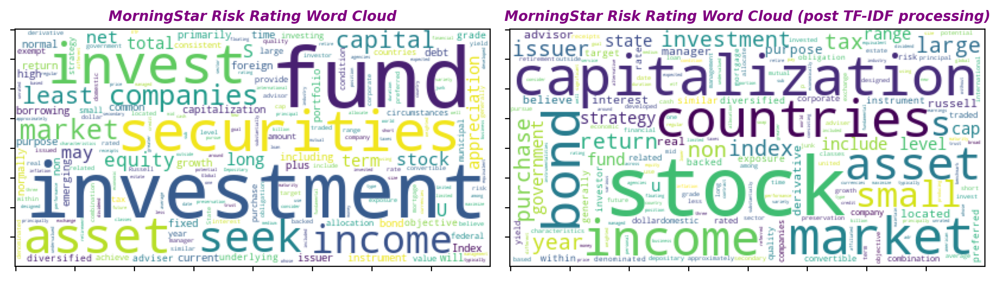

In [10]:
# Creating word_cloud with text as argument in .generate() method
fig, ax = plt.subplots(1, 2, figsize = (10, 10), dpi=250)
stopwords = STOPWORDS

word_cloud = WordCloud(collocations = False, background_color = 'white', stopwords = stopwords).generate(morningstar_riskRatingStratergyText)
ax[0].set_title('MorningStar Risk Rating Word Cloud', fontsize = 10, fontstyle='italic', color = 'purple', fontweight = 'bold')

ax[0].imshow(word_cloud)
ax[0].set_yticklabels([])
ax[0].set_xticklabels([])
# ax[0].axis("off")

tf_mappingText = getTFMapping(morningstar_riskRatingStratergyText)
word_cloud = WordCloud(collocations = False, background_color = 'white', stopwords = stopwords).generate(tf_mappingText)

ax[1].set_title('MorningStar Risk Rating Word Cloud (post TF-IDF processing)', fontsize = 10, fontstyle='italic', color = 'purple', fontweight = 'bold')
ax[1].imshow(word_cloud)
ax[1].set_yticklabels([])
ax[1].set_xticklabels([])
# ax[1].axis("off")

plt.tight_layout()
plt.show()

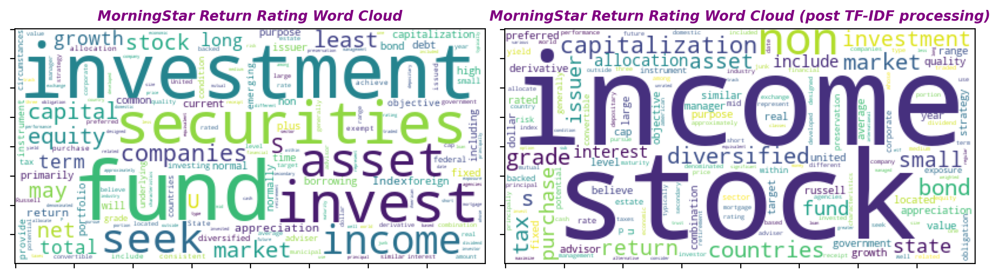

In [11]:
fig, ax = plt.subplots(1, 2, figsize = (10, 10), dpi=250)
stopwords = STOPWORDS

word_cloud = WordCloud(collocations = False, background_color = 'white', stopwords = stopwords).generate(morningstar_returnRatingStratergyText)
ax[0].set_title('MorningStar Return Rating Word Cloud', fontsize = 10, fontstyle='italic', color = 'purple', fontweight = 'bold')

ax[0].imshow(word_cloud)
ax[0].set_yticklabels([])
ax[0].set_xticklabels([])
# ax[0].axis("off")

tf_mappingText = getTFMapping(morningstar_returnRatingStratergyText)
word_cloud = WordCloud(collocations = False, background_color = 'white', stopwords = stopwords).generate(tf_mappingText)

ax[1].set_title('MorningStar Return Rating Word Cloud (post TF-IDF processing)', fontsize = 10, fontstyle='italic', color = 'purple', fontweight = 'bold')
ax[1].imshow(word_cloud)
ax[1].set_yticklabels([])
ax[1].set_xticklabels([])
# ax[1].axis("off")

plt.tight_layout()
plt.show()

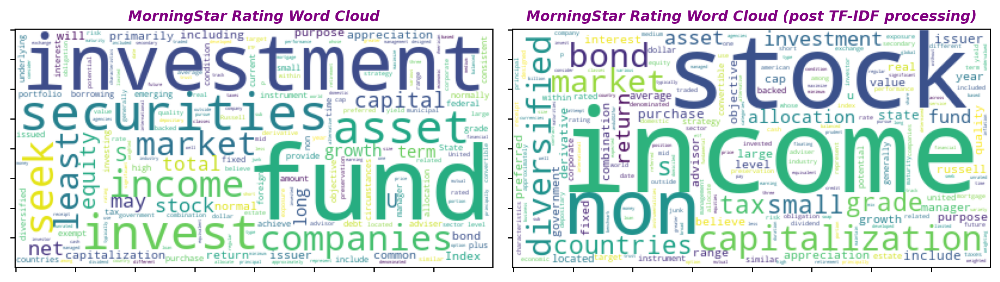

In [12]:
fig, ax = plt.subplots(1, 2, figsize = (10, 10), dpi=250)
stopwords = STOPWORDS

word_cloud = WordCloud(collocations = False, background_color = 'white', stopwords = stopwords).generate(morningstar_RatingStratergyText)
ax[0].set_title('MorningStar Rating Word Cloud', fontsize = 10, fontstyle='italic', color = 'purple', fontweight = 'bold')

ax[0].imshow(word_cloud)
ax[0].set_yticklabels([])
ax[0].set_xticklabels([])
# ax[0].axis("off")

tf_mappingText = getTFMapping(morningstar_RatingStratergyText)
word_cloud = WordCloud(collocations = False, background_color = 'white', stopwords = stopwords).generate(tf_mappingText)

ax[1].set_title('MorningStar Rating Word Cloud (post TF-IDF processing)', fontsize = 10, fontstyle='italic', color = 'purple', fontweight = 'bold')
ax[1].imshow(word_cloud)
ax[1].set_yticklabels([])
ax[1].set_xticklabels([])
# ax[1].axis("off")

plt.tight_layout()
plt.show()

## Q2: What has been the outperformance of Equities to Bonds
#### Ans: The Equities have always outperformed bonds over longer time periods (greater than 3years)
#### Assumption: Taking mean returns over the catergory (Equity = Funds having more than 70% assets in Equity and Bonds = Funds having less than 40% assets in Equity

In [13]:
# display the dataframe head
MutualFund_Data.head()

,inception_date,category,rating,return_rating,risk_rating,investment_strategy,investment_type,size_type,fund_net_annual_expense_ratio,category_net_annual_expense_ratio,asset_cash,asset_stocks,asset_bonds,asset_others,asset_preferred,asset_convertable,bond_maturity,bond_duration,fund_yield,fund_return_ytd,category_return_ytd,fund_return_1month,category_return_1month,fund_return_3months,category_return_3months,fund_return_1year,category_return_1year,fund_return_3years,category_return_3years,fund_return_5years,category_return_5years,fund_return_10years,category_return_10years,years_up,years_down,quarters_up,quarters_down,fund_alpha_3years,category_alpha_3years,fund_alpha_5years,category_alpha_5years,fund_alpha_10years,category_alpha_10years,fund_beta_3years,category_beta_3years,fund_beta_5years,category_beta_5years,fund_beta_10years,category_beta_10years,fund_mean_annual_return_3years,category_mean_annual_return_3years,fund_mean_annual_return_5years,category_mean_annual_return_5years,fund_mean_annual_return_10years,category_mean_annual_return_10years,fund_r_squared_3years,category_r_squared_3years,fund_r_squared_5years,category_r_squared_5years,fund_r_squared_10years,category_r_squared_10years,fund_standard_deviation_3years,category_standard_deviation_3years,fund_standard_deviation_5years,category_standard_deviation_5years,fund_standard_deviation_10years,category_standard_deviation_10years,fund_sharpe_ratio_3years,category_sharpe_ratio_3years,fund_sharpe_ratio_5years,category_sharpe_ratio_5years,fund_sharpe_ratio_10years,category_sharpe_ratio_10years,fund_treynor_ratio_3years,category_treynor_ratio_3years,fund_treynor_ratio_5years,category_treynor_ratio_5years,fund_treynor_ratio_10years,category_treynor_ratio_10years
fund_symbol,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
AAAAX,2007-07-29,World Allocation,3.0,3.0,3.0,The investment seeks total return in excess of...,Blend,Large,1.22,1.01,1.88,63.87,15.31,18.95,0.00,0.00,4.70,4.27,1.22,-7.60,-5.47,-1.71,-1.49,-1.02,-1.00,-5.22,-2.08,3.03,1.10,4.08,3.97,2.38,4.61,8.0,4.0,27,15,-2.51,-0.05,-2.86,-0.03,-3.86,-0.03,1.09,0.01,1.05,0.01,0.93,0.01,0.31,0.00,0.38,0.00,0.23,0.00,85.80,0.90,78.81,0.88,77.74,0.89,12.46,0.12,10.39,0.10,8.67,0.10,0.18,0.00,0.33,0.00,0.24,0.00,1.32,-0.00,2.77,0.03,1.91,0.04
AAADX,2011-12-29,Allocation - 50% to 70% Equity,4.0,5.0,5.0,The investment seeks income; long-term growth ...,Blend,Large,1.43,0.82,3.49,48.14,48.37,0.00,0.00,0.00,6.07,4.48,2.80,0.30,0.07,0.30,-1.33,4.70,-0.15,15.76,3.88,9.71,4.90,8.46,6.23,10.88,7.13,6.0,2.0,27,5,0.17,-0.01,-0.30,-0.01,-0.15,-0.00,1.17,0.01,1.36,0.01,1.45,0.01,0.80,0.00,0.72,0.01,0.92,0.01,87.23,0.94,84.28,0.92,89.77,0.92,8.46,0.12,10.21,0.10,11.70,0.09,0.93,0.00,0.74,0.01,0.89,0.01,6.82,0.03,5.38,0.05,7.1,0.06
AAAGX,1999-10-28,Large Growth,3.0,3.0,4.0,The investment seeks long-term capital appreci...,Growth,Large,1.12,1.04,1.54,98.46,0.00,0.00,0.00,0.00,4.50,3.45,0.00,24.20,17.54,-4.57,-2.64,1.48,1.64,32.91,25.92,19.44,15.98,15.26,14.64,14.71,14.19,14.0,6.0,31,12,7.68,0.05,2.92,0.02,0.77,0.01,1.06,0.01,1.04,0.01,1.08,0.01,1.65,0.01,1.30,0.01,1.25,0.01,90.82,0.91,85.84,0.88,87.04,0.88,19.81,0.19,16.49,0.16,15.40,0.15,0.92,0.01,0.88,0.01,0.93,0.01,16.87,0.14,13.48,0.13,13.03,0.13
AAAIX,2000-07-31,Allocation - 70% to 85% Equity,4.0,4.0,3.0,The investment seeks the highest level of tota...,Blend,Large,0.63,0.73,2.75,78.52,18.48,0.01,0.07,0.14,6.39,4.85,1.77,3.17,-2.67,-1.32,-1.46,1.22,0.19,8.36,1.83,6.79,3.98,8.19,6.21,8.66,7.46,13.0,6.0,34,8,0.07,-0.02,-0.78,-0.02,-0.48,-0.01,1.41,0.01,1.39,0.01,1.37,0.01,0.64,0.00,0.72,0.01,0.75,0.01,98.48,0.95,97.71,0.93,97.20,0.93,14.93,0.15,12.35,0.12,11.44,0.11,0.41,0.00,0.61,0.00,0.73,0.01,3.7,0.02,5.05,0.04,5.87,0.05
AAANX,2012-01-30,Tactical Allocation,3.0,4.0,5.0,The investment seeks capital appreciation. The...,Blend,Large,1.45,1.36,1.54,98.45,0.00,0.01,0.00,0.00,7.33,2.97,0.69,-3.26,-1.74,-2.43,-1.46,0.56,-0.58,1.73,1.54,3.04,2.24,5.73,4.36,NaN,4

In [14]:
equityFunds = MutualFund_Data[ MutualFund_Data['asset_stocks'] >= 70 ]
bondFunds = MutualFund_Data[ MutualFund_Data['asset_stocks'] <= 40 ]

display(equityFunds.head(3))
display(bondFunds.head(3))

,inception_date,category,rating,return_rating,risk_rating,investment_strategy,investment_type,size_type,fund_net_annual_expense_ratio,category_net_annual_expense_ratio,asset_cash,asset_stocks,asset_bonds,asset_others,asset_preferred,asset_convertable,bond_maturity,bond_duration,fund_yield,fund_return_ytd,category_return_ytd,fund_return_1month,category_return_1month,fund_return_3months,category_return_3months,fund_return_1year,category_return_1year,fund_return_3years,category_return_3years,fund_return_5years,category_return_5years,fund_return_10years,category_return_10years,years_up,years_down,quarters_up,quarters_down,fund_alpha_3years,category_alpha_3years,fund_alpha_5years,category_alpha_5years,fund_alpha_10years,category_alpha_10years,fund_beta_3years,category_beta_3years,fund_beta_5years,category_beta_5years,fund_beta_10years,category_beta_10years,fund_mean_annual_return_3years,category_mean_annual_return_3years,fund_mean_annual_return_5years,category_mean_annual_return_5years,fund_mean_annual_return_10years,category_mean_annual_return_10years,fund_r_squared_3years,category_r_squared_3years,fund_r_squared_5years,category_r_squared_5years,fund_r_squared_10years,category_r_squared_10years,fund_standard_deviation_3years,category_standard_deviation_3years,fund_standard_deviation_5years,category_standard_deviation_5years,fund_standard_deviation_10years,category_standard_deviation_10years,fund_sharpe_ratio_3years,category_sharpe_ratio_3years,fund_sharpe_ratio_5years,category_sharpe_ratio_5years,fund_sharpe_ratio_10years,category_sharpe_ratio_10years,fund_treynor_ratio_3years,category_treynor_ratio_3years,fund_treynor_ratio_5years,category_treynor_ratio_5years,fund_treynor_ratio_10years,category_treynor_ratio_10years
fund_symbol,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
AAAGX,1999-10-28,Large Growth,3.0,3.0,4.0,The investment seeks long-term capital appreci...,Growth,Large,1.12,1.04,1.54,98.46,0.00,0.00,0.00,0.00,4.50,3.45,0.00,24.20,17.54,-4.57,-2.64,1.48,1.64,32.91,25.92,19.44,15.98,15.26,14.64,14.71,14.19,14.0,6.0,31,12,7.68,0.05,2.92,0.02,0.77,0.01,1.06,0.01,1.04,0.01,1.08,0.01,1.65,0.01,1.30,0.01,1.25,0.01,90.82,0.91,85.84,0.88,87.04,0.88,19.81,0.19,16.49,0.16,15.40,0.15,0.92,0.01,0.88,0.01,0.93,0.01,16.87,0.14,13.48,0.13,13.03,0.13
AAAIX,2000-07-31,Allocation - 70% to 85% Equity,4.0,4.0,3.0,The investment seeks the highest level of tota...,Blend,Large,0.63,0.73,2.75,78.52,18.48,0.01,0.07,0.14,6.39,4.85,1.77,3.17,-2.67,-1.32,-1.46,1.22,0.19,8.36,1.83,6.79,3.98,8.19,6.21,8.66,7.46,13.0,6.0,34,8,0.07,-0.02,-0.78,-0.02,-0.48,-0.01,1.41,0.01,1.39,0.01,1.37,0.01,0.64,0.00,0.72,0.01,0.75,0.01,98.48,0.95,97.71,0.93,97.20,0.93,14.93,0.15,12.35,0.12,11.44,0.11,0.41,0.00,0.61,0.00,0.73,0.01,3.7,0.02,5.05,0.04,5.87,0.05
AAANX,2012-01-30,Tactical Allocation,3.0,4.0,5.0,The investment seeks capital appreciation. The...,Blend,Large,1.45,1.36,1.54,98.45,0.00,0.01,0.00,0.00,7.33,2.97,0.69,-3.26,-1.74,-2.43,-1.46,0.56,-0.58,1.73,1.54,3.04,2.24,5.73,4.36,NaN,4.26,5.0,2.0,26,8,-4.19,-0.03,-4.38,-0.02,NaN,-0.02,1.69,0.01,1.67,0.01,NaN,0.01,0.39,0.00,0.56,0.00,NaN,0.00,95.21,0.75,94.66,0.71,NaN,0.72,18.26,0.12,15.06,0.10,NaN,0.09,0.17,0.00,0.37,0.00,NaN,0.00,0.86,0.01,2.73,0.04,NaN,0.04


,inception_date,category,rating,return_rating,risk_rating,investment_strategy,investment_type,size_type,fund_net_annual_expense_ratio,category_net_annual_expense_ratio,asset_cash,asset_stocks,asset_bonds,asset_others,asset_preferred,asset_convertable,bond_maturity,bond_duration,fund_yield,fund_return_ytd,category_return_ytd,fund_return_1month,category_return_1month,fund_return_3months,category_return_3months,fund_return_1year,category_return_1year,fund_return_3years,category_return_3years,fund_return_5years,category_return_5years,fund_return_10years,category_return_10years,years_up,years_down,quarters_up,quarters_down,fund_alpha_3years,category_alpha_3years,fund_alpha_5years,category_alpha_5years,fund_alpha_10years,category_alpha_10years,fund_beta_3years,category_beta_3years,fund_beta_5years,category_beta_5years,fund_beta_10years,category_beta_10years,fund_mean_annual_return_3years,category_mean_annual_return_3years,fund_mean_annual_return_5years,category_mean_annual_return_5years,fund_mean_annual_return_10years,category_mean_annual_return_10years,fund_r_squared_3years,category_r_squared_3years,fund_r_squared_5years,category_r_squared_5years,fund_r_squared_10years,category_r_squared_10years,fund_standard_deviation_3years,category_standard_deviation_3years,fund_standard_deviation_5years,category_standard_deviation_5years,fund_standard_deviation_10years,category_standard_deviation_10years,fund_sharpe_ratio_3years,category_sharpe_ratio_3years,fund_sharpe_ratio_5years,category_sharpe_ratio_5years,fund_sharpe_ratio_10years,category_sharpe_ratio_10years,fund_treynor_ratio_3years,category_treynor_ratio_3years,fund_treynor_ratio_5years,category_treynor_ratio_5years,fund_treynor_ratio_10years,category_treynor_ratio_10years
fund_symbol,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
AAATX,2007-01-31,Target-Date 2000-2010,3.0,2.0,3.0,"The investment seeks growth, income and conser...",Value,Large,0.67,0.43,13.26,35.21,50.09,0.0,0.35,0.56,8.01,4.72,1.98,1.52,3.14,-1.30,-0.78,-0.79,-0.07,4.31,5.55,4.38,5.00,5.35,5.62,6.02,5.66,9.0,3.0,32,10,0.22,0.01,0.40,0.00,1.0,0.00,0.63,0.01,0.64,0.01,0.68,0.01,0.38,0.0,0.45,0.0,0.50,0.0,97.97,0.95,96.32,0.94,94.84,0.94,6.73,0.07,5.72,0.06,5.76,0.06,0.44,0.01,0.73,0.01,0.94,0.01,4.41,0.05,6.51,0.07,7.91,0.07
AABOX,2011-05-01,Intermediate Core Bond,2.0,2.0,2.0,The investment seeks total return. The fund in...,NaN,NaN,0.74,0.66,2.64,0.00,97.32,0.0,0.00,0.04,NaN,NaN,1.83,5.39,6.09,-0.65,-0.39,-1.07,-0.94,5.11,5.95,4.29,4.72,3.07,3.84,3.40,3.40,7.0,1.0,27,10,-0.66,-0.00,-0.91,-0.00,0.2,0.00,0.97,0.01,0.98,0.01,0.88,0.01,0.36,0.0,0.26,0.0,0.28,0.0,95.42,0.85,94.98,0.87,88.68,0.86,3.39,0.04,3.18,0.03,2.76,0.03,0.80,0.01,0.61,0.01,1.00,0.01,2.77,0.03,1.94,0.03,3.17,0.03
AAENX,2017-12-25,Multisector Bond,NaN,NaN,NaN,"The investment seeks current income and, secon...",NaN,NaN,1.02,1.00,9.73,0.00,90.27,0.0,0.00,0.00,NaN,NaN,1.65,4.99,0.85,-0.74,0.08,-1.62,0.51,4.44,1.87,NaN,3.06,NaN,4.07,NaN,4.11,2.0,NaN,10,1,NaN,-0.01,NaN,0.01,NaN,0.02,NaN,0.01,NaN,0.01,NaN,0.01,NaN,0.0,NaN,0.0,NaN,0.0,NaN,0.15,NaN,0.16,NaN,0.15,NaN,0.07,NaN,0.06,NaN,0.05,NaN,0.00,NaN,0.01,NaN,0.01,NaN,0.02,NaN,0.05,NaN,0.07


In [15]:
timePeriods = list(equityFunds.filter(regex='fund_return_'))
timePeriods.remove('fund_return_ytd')
timePeriods.insert(2, 'fund_return_ytd')
# print(timePeriods)

In [16]:
equityReturns = []
bondReturns = []

for time_period in timePeriods:
    meanEquityReturns = equityFunds[time_period].mean(skipna = True)
    meanBondReturns = bondFunds[time_period].mean(skipna = True)
    
    equityReturns.append(meanEquityReturns)
    bondReturns.append(meanBondReturns)
    
equityOutPerformance = [equity - bond for equity,bond in zip(equityReturns,bondReturns)]

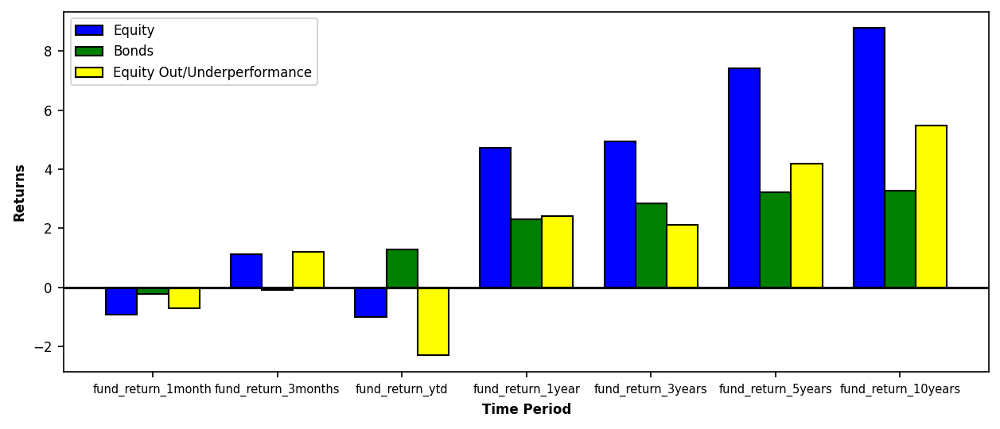

In [17]:
# set width of bar
barWidth = 0.25
fig = plt.subplots(figsize =(10, 4), dpi = 150)
 
# Set position of bar on X axis
br1 = equityReturns
br2 = bondReturns
br3 = equityOutPerformance
 
# Set position of bar on X axis
br1 = np.arange(len(equityReturns))
br2 = [x + barWidth for x in br1]
br3 = [x + barWidth for x in br2]    
br4 = [x + barWidth for x in br3]

# Make the plot
plt.bar(br1, equityReturns, color ='blue', width = barWidth,
        edgecolor ='black', label ='Equity')
plt.bar(br2, bondReturns, color ='green', width = barWidth,
        edgecolor ='black', label ='Bonds')
plt.bar(br3, equityOutPerformance, color = 'yellow', width = barWidth,
        edgecolor = 'black', label = 'Equity Out/Underperformance')

# Adding Xticks
plt.xlabel('Time Period', fontweight ='bold', fontsize = 8)
plt.ylabel('Returns', fontweight ='bold', fontsize = 8)
plt.yticks(fontsize = 8)
plt.xticks([r + barWidth for r in range(len(timePeriods))],
        timePeriods, fontsize = 7)
plt.axhline(y=0, color='black')
plt.legend(fontsize = 8)
plt.tight_layout
plt.show()

## Q3. Sharpe and Treynor ratios of ETFs vs MFs i.e. Does being passive result in better performance ratios?
#### Ans: Yes

In [18]:
display(MutualFund_Data.head(2))
display(ETF_Data.head(2))

,inception_date,category,rating,return_rating,risk_rating,investment_strategy,investment_type,size_type,fund_net_annual_expense_ratio,category_net_annual_expense_ratio,asset_cash,asset_stocks,asset_bonds,asset_others,asset_preferred,asset_convertable,bond_maturity,bond_duration,fund_yield,fund_return_ytd,category_return_ytd,fund_return_1month,category_return_1month,fund_return_3months,category_return_3months,fund_return_1year,category_return_1year,fund_return_3years,category_return_3years,fund_return_5years,category_return_5years,fund_return_10years,category_return_10years,years_up,years_down,quarters_up,quarters_down,fund_alpha_3years,category_alpha_3years,fund_alpha_5years,category_alpha_5years,fund_alpha_10years,category_alpha_10years,fund_beta_3years,category_beta_3years,fund_beta_5years,category_beta_5years,fund_beta_10years,category_beta_10years,fund_mean_annual_return_3years,category_mean_annual_return_3years,fund_mean_annual_return_5years,category_mean_annual_return_5years,fund_mean_annual_return_10years,category_mean_annual_return_10years,fund_r_squared_3years,category_r_squared_3years,fund_r_squared_5years,category_r_squared_5years,fund_r_squared_10years,category_r_squared_10years,fund_standard_deviation_3years,category_standard_deviation_3years,fund_standard_deviation_5years,category_standard_deviation_5years,fund_standard_deviation_10years,category_standard_deviation_10years,fund_sharpe_ratio_3years,category_sharpe_ratio_3years,fund_sharpe_ratio_5years,category_sharpe_ratio_5years,fund_sharpe_ratio_10years,category_sharpe_ratio_10years,fund_treynor_ratio_3years,category_treynor_ratio_3years,fund_treynor_ratio_5years,category_treynor_ratio_5years,fund_treynor_ratio_10years,category_treynor_ratio_10years
fund_symbol,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
AAAAX,2007-07-29,World Allocation,3.0,3.0,3.0,The investment seeks total return in excess of...,Blend,Large,1.22,1.01,1.88,63.87,15.31,18.95,0.0,0.0,4.70,4.27,1.22,-7.6,-5.47,-1.71,-1.49,-1.02,-1.00,-5.22,-2.08,3.03,1.1,4.08,3.97,2.38,4.61,8.0,4.0,27,15,-2.51,-0.05,-2.86,-0.03,-3.86,-0.03,1.09,0.01,1.05,0.01,0.93,0.01,0.31,0.0,0.38,0.00,0.23,0.00,85.80,0.90,78.81,0.88,77.74,0.89,12.46,0.12,10.39,0.1,8.67,0.10,0.18,0.0,0.33,0.00,0.24,0.00,1.32,-0.00,2.77,0.03,1.91,0.04
AAADX,2011-12-29,Allocation - 50% to 70% Equity,4.0,5.0,5.0,The investment seeks income; long-term growth ...,Blend,Large,1.43,0.82,3.49,48.14,48.37,0.00,0.0,0.0,6.07,4.48,2.80,0.3,0.07,0.30,-1.33,4.70,-0.15,15.76,3.88,9.71,4.9,8.46,6.23,10.88,7.13,6.0,2.0,27,5,0.17,-0.01,-0.30,-0.01,-0.15,-0.00,1.17,0.01,1.36,0.01,1.45,0.01,0.80,0.0,0.72,0.01,0.92,0.01,87.23,0.94,84.28,0.92,89.77,0.92,8.46,0.12,10.21,0.1,11.70,0.09,0.93,0.0,0.74,0.01,0.89,0.01,6.82,0.03,5.38,0.05,7.1,0.06


,inception_date,category,investment_strategy,investment_type,size_type,fund_net_annual_expense_ratio,category_net_annual_expense_ratio,asset_stocks,asset_bonds,fund_yield,fund_return_ytd,category_return_ytd,fund_return_1month,category_return_1month,fund_return_3months,category_return_3months,fund_return_1year,category_return_1year,fund_return_3years,category_return_3years,fund_return_5years,category_return_5years,fund_return_10years,category_return_10years,years_up,years_down,fund_alpha_3years,category_alpha_3years,fund_alpha_5years,category_alpha_5years,fund_alpha_10years,category_alpha_10years,fund_beta_3years,category_beta_3years,fund_beta_5years,category_beta_5years,fund_beta_10years,category_beta_10years,fund_mean_annual_return_3years,category_mean_annual_return_3years,fund_mean_annual_return_5years,category_mean_annual_return_5years,fund_mean_annual_return_10years,category_mean_annual_return_10years,fund_r_squared_3years,category_r_squared_3years,fund_r_squared_5years,category_r_squared_5years,fund_r_squared_10years,category_r_squared_10years,fund_standard_deviation_3years,category_standard_deviation_3years,fund_standard_deviation_5years,category_standard_deviation_5years,fund_standard_deviation_10years,category_standard_deviation_10years,fund_sharpe_ratio_3years,category_sharpe_ratio_3years,fund_sharpe_ratio_5years,category_sharpe_ratio_5years,fund_sharpe_ratio_10years,category_sharpe_ratio_10years,fund_treynor_ratio_3years,category_treynor_ratio_3years,fund_treynor_ratio_5years,category_treynor_ratio_5years,fund_treynor_ratio_10years,category_treynor_ratio_10years
fund_symbol,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
1305,2001-07-11,NaN,The investment seeks to track the price and yi...,Blend,Large,0.00,NaN,100.00,0.0,1.84,-6.62,NaN,1.22,NaN,-3.11,NaN,-5.17,NaN,3.83,NaN,7.86,NaN,9.25,NaN,12,4,0.29,NaN,0.39,NaN,0.35,NaN,1.0,NaN,0.98,NaN,0.99,NaN,0.40,NaN,0.72,NaN,0.86,NaN,99.72,NaN,99.70,NaN,99.68,NaN,14.38,NaN,14.75,NaN,16.89,NaN,0.34,NaN,0.59,NaN,0.60,NaN,3.92,NaN,8.01,NaN,9.29,NaN
1306,2001-07-11,NaN,The investment seeks to track the price and yi...,Blend,Large,0.05,NaN,99.99,0.0,1.77,-6.43,NaN,1.30,NaN,-3.10,NaN,-5.21,NaN,3.88,NaN,7.87,NaN,9.27,NaN,12,4,0.31,NaN,0.40,NaN,0.38,NaN,1.0,NaN,0.98,NaN,0.98,NaN,0.41,NaN,0.72,NaN,0.86,NaN,99.72,NaN,99.69,NaN,99.68,NaN,14.38,NaN,14.75,NaN,16.83,NaN,0.34,NaN,0.59,NaN,0.61,NaN,3.94,NaN,8.03,NaN,9.33,NaN


In [19]:
timePeriodSharpeRatio = list(MutualFund_Data.filter(regex='fund_sharpe_'))
timePeriodTreynorRatio = list(MutualFund_Data.filter(regex='fund_treynor_'))

In [20]:
print(timePeriodSharpeRatio)
print(timePeriodTreynorRatio)

['fund_sharpe_ratio_3years', 'fund_sharpe_ratio_5years', 'fund_sharpe_ratio_10years']
['fund_treynor_ratio_3years', 'fund_treynor_ratio_5years', 'fund_treynor_ratio_10years']


In [21]:
MFSharpeRatio = []
ETFSharpeRatio = []

for time_period in timePeriodSharpeRatio:
    
    sharpeRatioDataMF = MutualFund_Data[ MutualFund_Data[time_period] >= 0 ]
    sharpeRatioDataETF = ETF_Data[ ETF_Data[time_period] >= 0]
    
    meanSharpeRationMF = sharpeRatioDataMF[time_period].mean(skipna = True)
    meanSharpeRatioETF = sharpeRatioDataETF[time_period].mean(skipna = True)
    
    MFSharpeRatio.append(meanSharpeRationMF)
    ETFSharpeRatio.append(meanSharpeRatioETF)
    

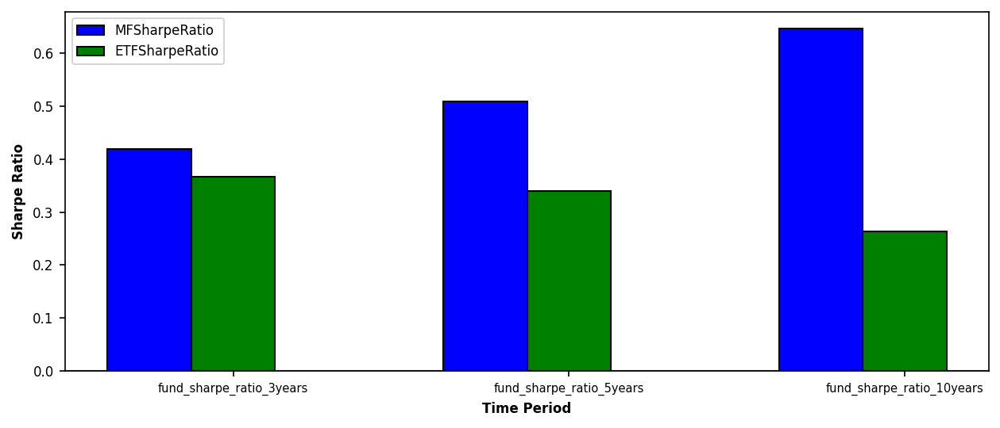

In [22]:
# set width of bar
barWidth = 0.25
fig = plt.subplots(figsize =(10, 4), dpi = 150)
 
# Set position of bar on X axis
br1 = np.arange(len(MFSharpeRatio))
br2 = [x + barWidth for x in br1]
br3 = [x + barWidth for x in br2]

# Make the plot
plt.bar(br1, MFSharpeRatio, color ='blue', width = barWidth,
        edgecolor ='black', label ='MFSharpeRatio')
plt.bar(br2, ETFSharpeRatio, color ='green', width = barWidth,
        edgecolor ='black', label ='ETFSharpeRatio')

# Adding Xticks
plt.xlabel('Time Period', fontweight ='bold', fontsize = 8)
plt.ylabel('Sharpe Ratio', fontweight ='bold', fontsize = 8)
plt.yticks(fontsize = 8)
plt.xticks([r + barWidth for r in range(len(timePeriodSharpeRatio))],
        timePeriodSharpeRatio, fontsize = 7)
plt.axhline(y=0, color='black')
plt.legend(fontsize = 8)
plt.tight_layout
plt.show()

In [23]:
MFTreynorRatio = []
ETFTreynorRatio = []

for time_period in timePeriodTreynorRatio:
    
    treynorRatioDataMF = []
    for i in MutualFund_Data.iterrows():
        if(isinstance(i[1][time_period], str)):
            i[1][time_period] = i[1][time_period].replace(',','')
            i[1][time_period] = float(i[1][time_period])
        if(i[1][time_period] >= -5 and i[1][time_period] <= 5):
            treynorRatioDataMF.append(i[1][time_period])
    
    treynorRatioDataETF = ETF_Data[ ETF_Data[time_period] >= -5]
    treynorRatioDataETF = treynorRatioDataETF[ treynorRatioDataETF[time_period] <= 5]
    
    meanTreynorRatioMF = sum(treynorRatioDataMF)/len(treynorRatioDataMF)
    meanTreynorRatioETF = treynorRatioDataETF[time_period].mean(skipna = True)
    
    MFTreynorRatio.append(meanTreynorRatioMF)
    ETFTreynorRatio.append(meanTreynorRatioETF)
    

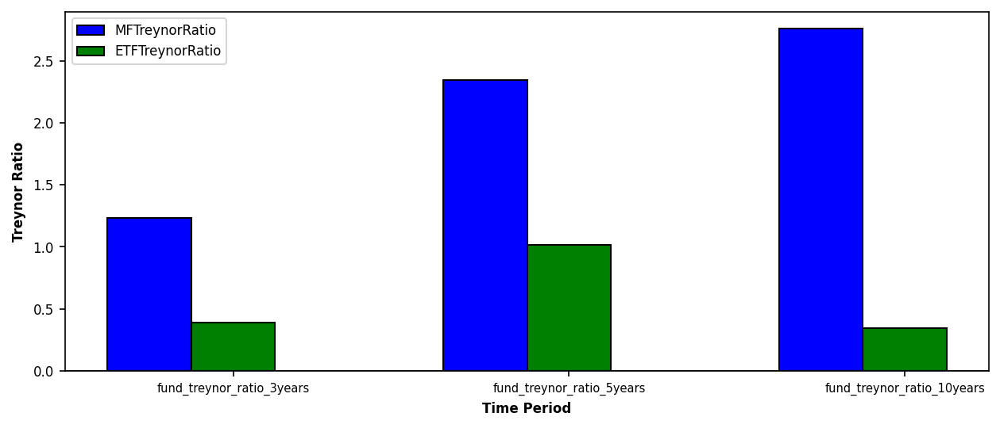

In [24]:
# set width of bar
barWidth = 0.25
fig = plt.subplots(figsize =(10, 4), dpi = 150)
 
# Set position of bar on X axis
br1 = np.arange(len(MFTreynorRatio))
br2 = [x + barWidth for x in br1]
br3 = [x + barWidth for x in br2]

# Make the plot
plt.bar(br1, MFTreynorRatio, color ='blue', width = barWidth,
        edgecolor ='black', label ='MFTreynorRatio')
plt.bar(br2, ETFTreynorRatio, color ='green', width = barWidth,
        edgecolor ='black', label ='ETFTreynorRatio')

# Adding Xticks
plt.xlabel('Time Period', fontweight ='bold', fontsize = 8)
plt.ylabel('Treynor Ratio', fontweight ='bold', fontsize = 8)
plt.yticks(fontsize = 8)
plt.xticks([r + barWidth for r in range(len(timePeriodTreynorRatio))],
        timePeriodTreynorRatio, fontsize = 7)
plt.axhline(y=0, color='black')
plt.legend(fontsize = 8)
plt.tight_layout
plt.show()

## Q4. Are ratings able to predict category outperformance?
#### Ans: Yes, there is correlation between rating and (fund return - category return)

In [25]:
display(MutualFund_Data.head(3))

,inception_date,category,rating,return_rating,risk_rating,investment_strategy,investment_type,size_type,fund_net_annual_expense_ratio,category_net_annual_expense_ratio,asset_cash,asset_stocks,asset_bonds,asset_others,asset_preferred,asset_convertable,bond_maturity,bond_duration,fund_yield,fund_return_ytd,category_return_ytd,fund_return_1month,category_return_1month,fund_return_3months,category_return_3months,fund_return_1year,category_return_1year,fund_return_3years,category_return_3years,fund_return_5years,category_return_5years,fund_return_10years,category_return_10years,years_up,years_down,quarters_up,quarters_down,fund_alpha_3years,category_alpha_3years,fund_alpha_5years,category_alpha_5years,fund_alpha_10years,category_alpha_10years,fund_beta_3years,category_beta_3years,fund_beta_5years,category_beta_5years,fund_beta_10years,category_beta_10years,fund_mean_annual_return_3years,category_mean_annual_return_3years,fund_mean_annual_return_5years,category_mean_annual_return_5years,fund_mean_annual_return_10years,category_mean_annual_return_10years,fund_r_squared_3years,category_r_squared_3years,fund_r_squared_5years,category_r_squared_5years,fund_r_squared_10years,category_r_squared_10years,fund_standard_deviation_3years,category_standard_deviation_3years,fund_standard_deviation_5years,category_standard_deviation_5years,fund_standard_deviation_10years,category_standard_deviation_10years,fund_sharpe_ratio_3years,category_sharpe_ratio_3years,fund_sharpe_ratio_5years,category_sharpe_ratio_5years,fund_sharpe_ratio_10years,category_sharpe_ratio_10years,fund_treynor_ratio_3years,category_treynor_ratio_3years,fund_treynor_ratio_5years,category_treynor_ratio_5years,fund_treynor_ratio_10years,category_treynor_ratio_10years
fund_symbol,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
AAAAX,2007-07-29,World Allocation,3.0,3.0,3.0,The investment seeks total return in excess of...,Blend,Large,1.22,1.01,1.88,63.87,15.31,18.95,0.0,0.0,4.70,4.27,1.22,-7.6,-5.47,-1.71,-1.49,-1.02,-1.00,-5.22,-2.08,3.03,1.10,4.08,3.97,2.38,4.61,8.0,4.0,27,15,-2.51,-0.05,-2.86,-0.03,-3.86,-0.03,1.09,0.01,1.05,0.01,0.93,0.01,0.31,0.00,0.38,0.00,0.23,0.00,85.80,0.90,78.81,0.88,77.74,0.89,12.46,0.12,10.39,0.10,8.67,0.10,0.18,0.00,0.33,0.00,0.24,0.00,1.32,-0.00,2.77,0.03,1.91,0.04
AAADX,2011-12-29,Allocation - 50% to 70% Equity,4.0,5.0,5.0,The investment seeks income; long-term growth ...,Blend,Large,1.43,0.82,3.49,48.14,48.37,0.00,0.0,0.0,6.07,4.48,2.80,0.3,0.07,0.30,-1.33,4.70,-0.15,15.76,3.88,9.71,4.90,8.46,6.23,10.88,7.13,6.0,2.0,27,5,0.17,-0.01,-0.30,-0.01,-0.15,-0.00,1.17,0.01,1.36,0.01,1.45,0.01,0.80,0.00,0.72,0.01,0.92,0.01,87.23,0.94,84.28,0.92,89.77,0.92,8.46,0.12,10.21,0.10,11.70,0.09,0.93,0.00,0.74,0.01,0.89,0.01,6.82,0.03,5.38,0.05,7.1,0.06
AAAGX,1999-10-28,Large Growth,3.0,3.0,4.0,The investment seeks long-term capital appreci...,Growth,Large,1.12,1.04,1.54,98.46,0.00,0.00,0.0,0.0,4.50,3.45,0.00,24.2,17.54,-4.57,-2.64,1.48,1.64,32.91,25.92,19.44,15.98,15.26,14.64,14.71,14.19,14.0,6.0,31,12,7.68,0.05,2.92,0.02,0.77,0.01,1.06,0.01,1.04,0.01,1.08,0.01,1.65,0.01,1.30,0.01,1.25,0.01,90.82,0.91,85.84,0.88,87.04,0.88,19.81,0.19,16.49,0.16,15.40,0.15,0.92,0.01,0.88,0.01,0.93,0.01,16.87,0.14,13.48,0.13,13.03,0.13


In [26]:
ratingsDF = MutualFund_Data.filter(['risk_rating','return_rating','rating'], axis=1)

columnsReturns = list(MutualFund_Data.filter(regex='fund_return_'))
categoryReturns = list(MutualFund_Data.filter(regex='category_return'))
returnsDF = MutualFund_Data.filter(columnsReturns + categoryReturns, axis=1)

for i,j in zip(columnsReturns,categoryReturns):
    returnsDF['returnsDiff'+i] = returnsDF[i] - returnsDF[j]
    returnsDF = returnsDF.drop(axis = 1, columns = [i,j])

In [27]:
ratingsDF.head()
returnsDF.head()

,returnsDifffund_return_ytd,returnsDifffund_return_1month,returnsDifffund_return_3months,returnsDifffund_return_1year,returnsDifffund_return_3years,returnsDifffund_return_5years,returnsDifffund_return_10years
fund_symbol,,,,,,,
AAAAX,-2.13,-0.22,-0.02,-3.14,1.93,0.11,-2.23
AAADX,0.23,1.63,4.85,11.88,4.81,2.23,3.75
AAAGX,6.66,-1.93,-0.16,6.99,3.46,0.62,0.52
AAAIX,5.84,0.14,1.03,6.53,2.81,1.98,1.20
AAANX,-1.52,-0.97,1.14,0.19,0.80,1.37,NaN


In [28]:
ratingsReturnsDF = pd.merge(ratingsDF, returnsDF, left_index=True, right_index=True)

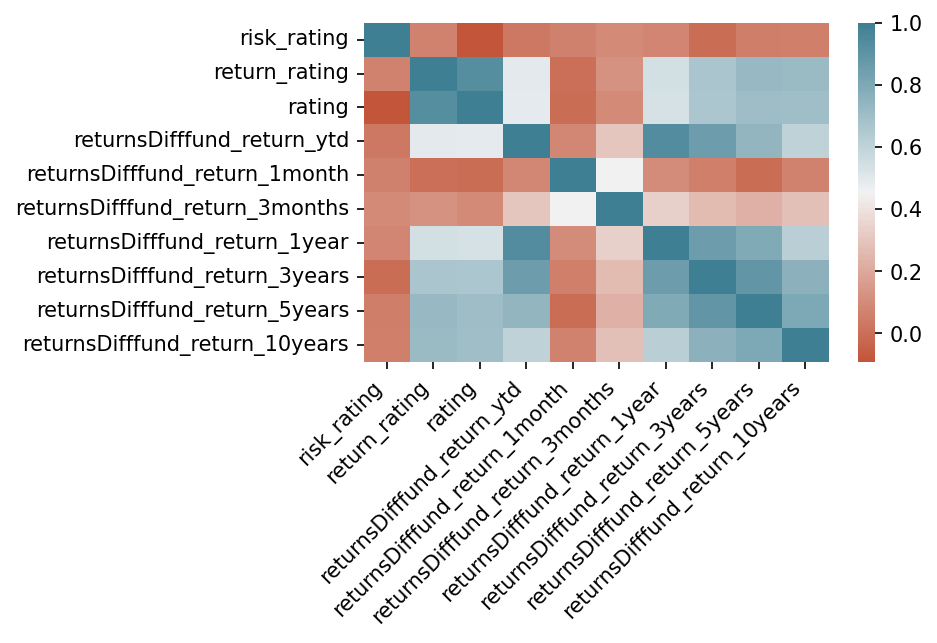

In [29]:
fig, ax = plt.subplots(figsize = (5, 3), dpi=150)
ax = seaborn.heatmap(
    ratingsReturnsDF.corr(), 
    cmap=seaborn.diverging_palette(20, 220, n=200),
)
ax.set_xticklabels(
    ax.get_xticklabels(),
    rotation=45,
    horizontalalignment='right'
);
plt.show()

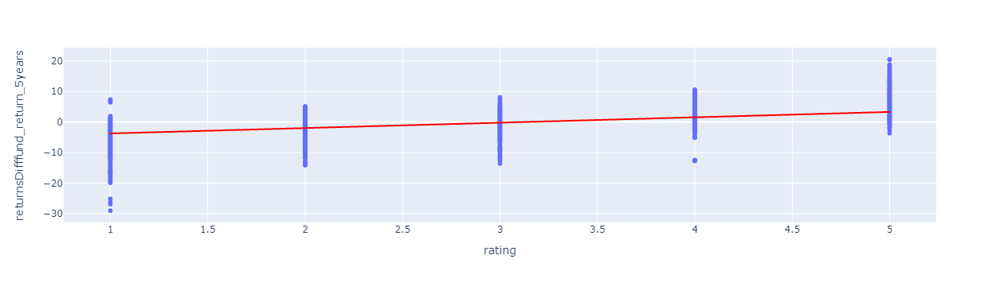

                            OLS Regression Results                            
Dep. Variable:                      y   R-squared:                       0.500
Model:                            OLS   Adj. R-squared:                  0.500
Method:                 Least Squares   F-statistic:                 2.201e+04
Date:                Wed, 22 Sep 2021   Prob (F-statistic):               0.00
Time:                        12:43:34   Log-Likelihood:                -45731.
No. Observations:               22029   AIC:                         9.147e+04
Df Residuals:                   22027   BIC:                         9.148e+04
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const         -5.4982      0.038   -143.204      0.0

In [30]:
fig = px.scatter(ratingsReturnsDF, x='rating', y='returnsDifffund_return_5years', trendline="ols", trendline_color_override='red')
fig.show()
results = px.get_trendline_results(fig)
print(results.px_fit_results.iloc[0].summary())

## Q5. Are the assumptions of Fama French Model three-factor model still valid?
###   - Do small caps outperform large caps?
####     Ans: Looks like over the long term the difference decreases but during the short term (<1yr) things are unpredictable (probably due to COVID!)

In [31]:
MutualFund_Data.head()

,inception_date,category,rating,return_rating,risk_rating,investment_strategy,investment_type,size_type,fund_net_annual_expense_ratio,category_net_annual_expense_ratio,asset_cash,asset_stocks,asset_bonds,asset_others,asset_preferred,asset_convertable,bond_maturity,bond_duration,fund_yield,fund_return_ytd,category_return_ytd,fund_return_1month,category_return_1month,fund_return_3months,category_return_3months,fund_return_1year,category_return_1year,fund_return_3years,category_return_3years,fund_return_5years,category_return_5years,fund_return_10years,category_return_10years,years_up,years_down,quarters_up,quarters_down,fund_alpha_3years,category_alpha_3years,fund_alpha_5years,category_alpha_5years,fund_alpha_10years,category_alpha_10years,fund_beta_3years,category_beta_3years,fund_beta_5years,category_beta_5years,fund_beta_10years,category_beta_10years,fund_mean_annual_return_3years,category_mean_annual_return_3years,fund_mean_annual_return_5years,category_mean_annual_return_5years,fund_mean_annual_return_10years,category_mean_annual_return_10years,fund_r_squared_3years,category_r_squared_3years,fund_r_squared_5years,category_r_squared_5years,fund_r_squared_10years,category_r_squared_10years,fund_standard_deviation_3years,category_standard_deviation_3years,fund_standard_deviation_5years,category_standard_deviation_5years,fund_standard_deviation_10years,category_standard_deviation_10years,fund_sharpe_ratio_3years,category_sharpe_ratio_3years,fund_sharpe_ratio_5years,category_sharpe_ratio_5years,fund_sharpe_ratio_10years,category_sharpe_ratio_10years,fund_treynor_ratio_3years,category_treynor_ratio_3years,fund_treynor_ratio_5years,category_treynor_ratio_5years,fund_treynor_ratio_10years,category_treynor_ratio_10years
fund_symbol,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
AAAAX,2007-07-29,World Allocation,3.0,3.0,3.0,The investment seeks total return in excess of...,Blend,Large,1.22,1.01,1.88,63.87,15.31,18.95,0.00,0.00,4.70,4.27,1.22,-7.60,-5.47,-1.71,-1.49,-1.02,-1.00,-5.22,-2.08,3.03,1.10,4.08,3.97,2.38,4.61,8.0,4.0,27,15,-2.51,-0.05,-2.86,-0.03,-3.86,-0.03,1.09,0.01,1.05,0.01,0.93,0.01,0.31,0.00,0.38,0.00,0.23,0.00,85.80,0.90,78.81,0.88,77.74,0.89,12.46,0.12,10.39,0.10,8.67,0.10,0.18,0.00,0.33,0.00,0.24,0.00,1.32,-0.00,2.77,0.03,1.91,0.04
AAADX,2011-12-29,Allocation - 50% to 70% Equity,4.0,5.0,5.0,The investment seeks income; long-term growth ...,Blend,Large,1.43,0.82,3.49,48.14,48.37,0.00,0.00,0.00,6.07,4.48,2.80,0.30,0.07,0.30,-1.33,4.70,-0.15,15.76,3.88,9.71,4.90,8.46,6.23,10.88,7.13,6.0,2.0,27,5,0.17,-0.01,-0.30,-0.01,-0.15,-0.00,1.17,0.01,1.36,0.01,1.45,0.01,0.80,0.00,0.72,0.01,0.92,0.01,87.23,0.94,84.28,0.92,89.77,0.92,8.46,0.12,10.21,0.10,11.70,0.09,0.93,0.00,0.74,0.01,0.89,0.01,6.82,0.03,5.38,0.05,7.1,0.06
AAAGX,1999-10-28,Large Growth,3.0,3.0,4.0,The investment seeks long-term capital appreci...,Growth,Large,1.12,1.04,1.54,98.46,0.00,0.00,0.00,0.00,4.50,3.45,0.00,24.20,17.54,-4.57,-2.64,1.48,1.64,32.91,25.92,19.44,15.98,15.26,14.64,14.71,14.19,14.0,6.0,31,12,7.68,0.05,2.92,0.02,0.77,0.01,1.06,0.01,1.04,0.01,1.08,0.01,1.65,0.01,1.30,0.01,1.25,0.01,90.82,0.91,85.84,0.88,87.04,0.88,19.81,0.19,16.49,0.16,15.40,0.15,0.92,0.01,0.88,0.01,0.93,0.01,16.87,0.14,13.48,0.13,13.03,0.13
AAAIX,2000-07-31,Allocation - 70% to 85% Equity,4.0,4.0,3.0,The investment seeks the highest level of tota...,Blend,Large,0.63,0.73,2.75,78.52,18.48,0.01,0.07,0.14,6.39,4.85,1.77,3.17,-2.67,-1.32,-1.46,1.22,0.19,8.36,1.83,6.79,3.98,8.19,6.21,8.66,7.46,13.0,6.0,34,8,0.07,-0.02,-0.78,-0.02,-0.48,-0.01,1.41,0.01,1.39,0.01,1.37,0.01,0.64,0.00,0.72,0.01,0.75,0.01,98.48,0.95,97.71,0.93,97.20,0.93,14.93,0.15,12.35,0.12,11.44,0.11,0.41,0.00,0.61,0.00,0.73,0.01,3.7,0.02,5.05,0.04,5.87,0.05
AAANX,2012-01-30,Tactical Allocation,3.0,4.0,5.0,The investment seeks capital appreciation. The...,Blend,Large,1.45,1.36,1.54,98.45,0.00,0.01,0.00,0.00,7.33,2.97,0.69,-3.26,-1.74,-2.43,-1.46,0.56,-0.58,1.73,1.54,3.04,2.24,5.73,4.36,NaN,4

In [32]:
largeCapFunds = MutualFund_Data[ MutualFund_Data['size_type'] == 'Large' ]
smallCapFunds = MutualFund_Data[ MutualFund_Data['size_type'] == 'Small' ]

In [33]:
timePeriods = list(largeCapFunds.filter(regex='fund_return_'))
timePeriods.remove('fund_return_ytd')
timePeriods.insert(2, 'fund_return_ytd')

In [34]:
largeCapReturns = []
smallCapReturns = []

for time_period in timePeriods:
    meanLargeCapReturns = largeCapFunds[time_period].mean(skipna = True)
    meanSmallCapReturns = smallCapFunds[time_period].mean(skipna = True)

    largeCapReturns.append(meanLargeCapReturns)
    smallCapReturns.append(meanSmallCapReturns)
    
smallMinusBig = [small - big for small,big in zip(smallCapReturns,largeCapReturns)]

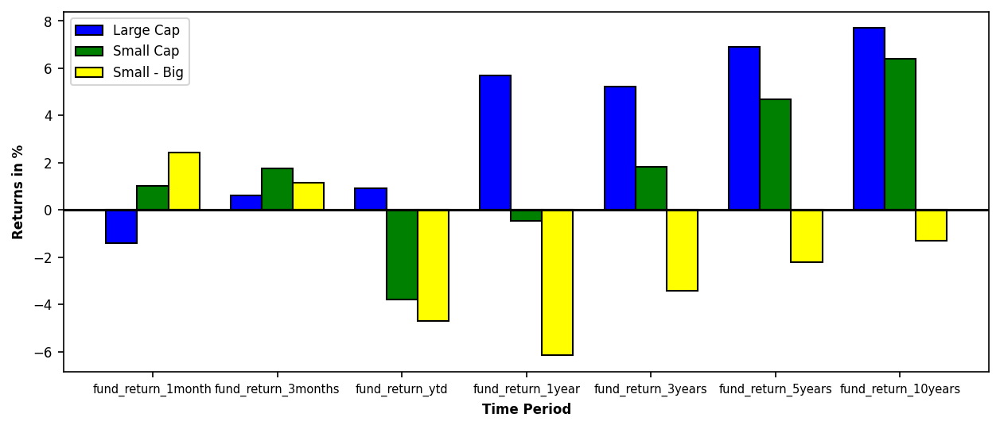

In [35]:
# set width of bar
barWidth = 0.25
fig = plt.subplots(figsize =(10, 4), dpi = 150)
 
# Set position of bar on X axis
br1 = largeCapReturns
br2 = smallCapReturns
br3 = smallMinusBig
 
# Set position of bar on X axis
br1 = np.arange(len(largeCapReturns))
br2 = [x + barWidth for x in br1]
br3 = [x + barWidth for x in br2]    
br4 = [x + barWidth for x in br3]

# Make the plot
plt.bar(br1, largeCapReturns, color ='blue', width = barWidth,
        edgecolor ='black', label ='Large Cap')
plt.bar(br2, smallCapReturns, color ='green', width = barWidth,
        edgecolor ='black', label ='Small Cap')
plt.bar(br3, smallMinusBig, color = 'yellow', width = barWidth,
        edgecolor = 'black', label = 'Small - Big')

# Adding Xticks
plt.xlabel('Time Period', fontweight ='bold', fontsize = 8)
plt.ylabel('Returns in %', fontweight ='bold', fontsize = 8)
plt.yticks(fontsize = 8)
plt.xticks([r + barWidth for r in range(len(timePeriods))],
        timePeriods, fontsize = 7)
plt.axhline(y=0, color='black')
plt.legend(fontsize = 8)
plt.tight_layout
plt.show()

## Q5. Are the assumptions of Fama French Model three-factor model still valid?
###   - Do value funds outperform growth funds?
####     Ans: Looks like it's the other way round! Over the last 10 years, value funds have consistently underperformed the growht funds

In [36]:
MutualFund_Data.head(2)

,inception_date,category,rating,return_rating,risk_rating,investment_strategy,investment_type,size_type,fund_net_annual_expense_ratio,category_net_annual_expense_ratio,asset_cash,asset_stocks,asset_bonds,asset_others,asset_preferred,asset_convertable,bond_maturity,bond_duration,fund_yield,fund_return_ytd,category_return_ytd,fund_return_1month,category_return_1month,fund_return_3months,category_return_3months,fund_return_1year,category_return_1year,fund_return_3years,category_return_3years,fund_return_5years,category_return_5years,fund_return_10years,category_return_10years,years_up,years_down,quarters_up,quarters_down,fund_alpha_3years,category_alpha_3years,fund_alpha_5years,category_alpha_5years,fund_alpha_10years,category_alpha_10years,fund_beta_3years,category_beta_3years,fund_beta_5years,category_beta_5years,fund_beta_10years,category_beta_10years,fund_mean_annual_return_3years,category_mean_annual_return_3years,fund_mean_annual_return_5years,category_mean_annual_return_5years,fund_mean_annual_return_10years,category_mean_annual_return_10years,fund_r_squared_3years,category_r_squared_3years,fund_r_squared_5years,category_r_squared_5years,fund_r_squared_10years,category_r_squared_10years,fund_standard_deviation_3years,category_standard_deviation_3years,fund_standard_deviation_5years,category_standard_deviation_5years,fund_standard_deviation_10years,category_standard_deviation_10years,fund_sharpe_ratio_3years,category_sharpe_ratio_3years,fund_sharpe_ratio_5years,category_sharpe_ratio_5years,fund_sharpe_ratio_10years,category_sharpe_ratio_10years,fund_treynor_ratio_3years,category_treynor_ratio_3years,fund_treynor_ratio_5years,category_treynor_ratio_5years,fund_treynor_ratio_10years,category_treynor_ratio_10years
fund_symbol,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
AAAAX,2007-07-29,World Allocation,3.0,3.0,3.0,The investment seeks total return in excess of...,Blend,Large,1.22,1.01,1.88,63.87,15.31,18.95,0.0,0.0,4.70,4.27,1.22,-7.6,-5.47,-1.71,-1.49,-1.02,-1.00,-5.22,-2.08,3.03,1.1,4.08,3.97,2.38,4.61,8.0,4.0,27,15,-2.51,-0.05,-2.86,-0.03,-3.86,-0.03,1.09,0.01,1.05,0.01,0.93,0.01,0.31,0.0,0.38,0.00,0.23,0.00,85.80,0.90,78.81,0.88,77.74,0.89,12.46,0.12,10.39,0.1,8.67,0.10,0.18,0.0,0.33,0.00,0.24,0.00,1.32,-0.00,2.77,0.03,1.91,0.04
AAADX,2011-12-29,Allocation - 50% to 70% Equity,4.0,5.0,5.0,The investment seeks income; long-term growth ...,Blend,Large,1.43,0.82,3.49,48.14,48.37,0.00,0.0,0.0,6.07,4.48,2.80,0.3,0.07,0.30,-1.33,4.70,-0.15,15.76,3.88,9.71,4.9,8.46,6.23,10.88,7.13,6.0,2.0,27,5,0.17,-0.01,-0.30,-0.01,-0.15,-0.00,1.17,0.01,1.36,0.01,1.45,0.01,0.80,0.0,0.72,0.01,0.92,0.01,87.23,0.94,84.28,0.92,89.77,0.92,8.46,0.12,10.21,0.1,11.70,0.09,0.93,0.0,0.74,0.01,0.89,0.01,6.82,0.03,5.38,0.05,7.1,0.06


In [37]:
print(MutualFund_Data['investment_type'].unique())
growthFunds = MutualFund_Data[ MutualFund_Data['investment_type'] == 'Growth' ]
valueFunds = MutualFund_Data[ MutualFund_Data['investment_type'] == 'Value' ]
blendFunds = MutualFund_Data[ MutualFund_Data['investment_type'] == 'Blend' ]

['Blend' 'Growth' 'Value' nan]


In [38]:
timePeriods = list(largeCapFunds.filter(regex='fund_return_'))
timePeriods.remove('fund_return_ytd')
timePeriods.insert(2, 'fund_return_ytd')

In [39]:
growthReturns = []
valueReturns = []
blendReturns = []

for time_period in timePeriods:
    meanGrowthReturns = growthFunds[time_period].mean(skipna = True)
    meanValueReturns = valueFunds[time_period].mean(skipna = True)
    meanBlendReturns = blendFunds[time_period].mean(skipna = True)

    growthReturns.append(meanGrowthReturns)
    valueReturns.append(meanValueReturns)
    blendReturns.append(meanBlendReturns)
    
highMinusLow = [value - growth for value,growth in zip(valueReturns,growthReturns)]

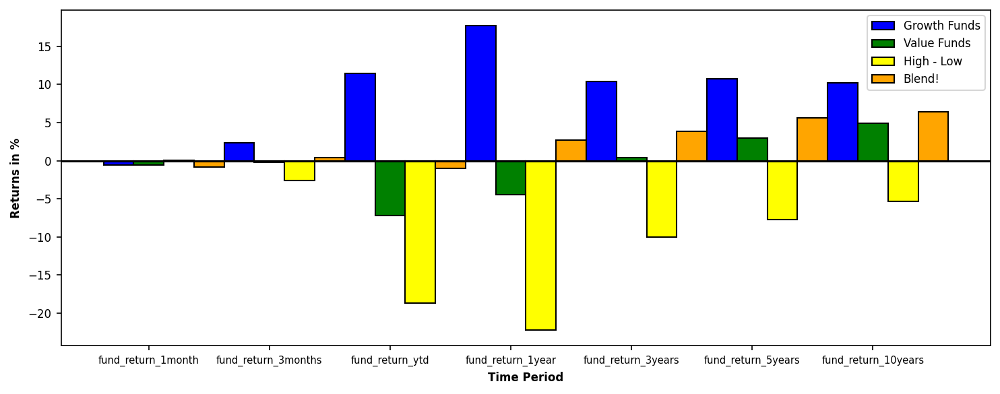

In [40]:
# set width of bar
barWidth = 0.25
fig = plt.subplots(figsize =(10, 4), dpi = 150)
 
# Set position of bar on X axis
br1 = growthReturns
br2 = valueReturns
br3 = highMinusLow
br4 = blendReturns

# Set position of bar on X axis
br1 = np.arange(len(growthReturns))
br2 = [x + barWidth for x in br1]
br3 = [x + barWidth for x in br2]    
br4 = [x + barWidth for x in br3]

# Make the plot
plt.bar(br1, growthReturns, color ='blue', width = barWidth,
        edgecolor ='black', label ='Growth Funds')
plt.bar(br2, valueReturns, color ='green', width = barWidth,
        edgecolor ='black', label ='Value Funds')
plt.bar(br3, highMinusLow, color = 'yellow', width = barWidth,
        edgecolor = 'black', label = 'High - Low')
plt.bar(br4, blendReturns, color = 'orange', width = barWidth,
        edgecolor = 'black', label = 'Blend!')

# Adding Xticks
plt.xlabel('Time Period', fontweight ='bold', fontsize = 8)
plt.ylabel('Returns in %', fontweight ='bold', fontsize = 8)
plt.yticks(fontsize = 8)
plt.xticks([r + barWidth for r in range(len(timePeriods))],
        timePeriods, fontsize = 7)
plt.axhline(y=0, color='black')
plt.legend(fontsize = 8)
plt.tight_layout()
plt.show()

## Q6. higher expense ratio = higher alpha?
#### Ans: Looks like we're better off with a lower expense ratio

In [41]:
MutualFund_Data.head()

,inception_date,category,rating,return_rating,risk_rating,investment_strategy,investment_type,size_type,fund_net_annual_expense_ratio,category_net_annual_expense_ratio,asset_cash,asset_stocks,asset_bonds,asset_others,asset_preferred,asset_convertable,bond_maturity,bond_duration,fund_yield,fund_return_ytd,category_return_ytd,fund_return_1month,category_return_1month,fund_return_3months,category_return_3months,fund_return_1year,category_return_1year,fund_return_3years,category_return_3years,fund_return_5years,category_return_5years,fund_return_10years,category_return_10years,years_up,years_down,quarters_up,quarters_down,fund_alpha_3years,category_alpha_3years,fund_alpha_5years,category_alpha_5years,fund_alpha_10years,category_alpha_10years,fund_beta_3years,category_beta_3years,fund_beta_5years,category_beta_5years,fund_beta_10years,category_beta_10years,fund_mean_annual_return_3years,category_mean_annual_return_3years,fund_mean_annual_return_5years,category_mean_annual_return_5years,fund_mean_annual_return_10years,category_mean_annual_return_10years,fund_r_squared_3years,category_r_squared_3years,fund_r_squared_5years,category_r_squared_5years,fund_r_squared_10years,category_r_squared_10years,fund_standard_deviation_3years,category_standard_deviation_3years,fund_standard_deviation_5years,category_standard_deviation_5years,fund_standard_deviation_10years,category_standard_deviation_10years,fund_sharpe_ratio_3years,category_sharpe_ratio_3years,fund_sharpe_ratio_5years,category_sharpe_ratio_5years,fund_sharpe_ratio_10years,category_sharpe_ratio_10years,fund_treynor_ratio_3years,category_treynor_ratio_3years,fund_treynor_ratio_5years,category_treynor_ratio_5years,fund_treynor_ratio_10years,category_treynor_ratio_10years
fund_symbol,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
AAAAX,2007-07-29,World Allocation,3.0,3.0,3.0,The investment seeks total return in excess of...,Blend,Large,1.22,1.01,1.88,63.87,15.31,18.95,0.00,0.00,4.70,4.27,1.22,-7.60,-5.47,-1.71,-1.49,-1.02,-1.00,-5.22,-2.08,3.03,1.10,4.08,3.97,2.38,4.61,8.0,4.0,27,15,-2.51,-0.05,-2.86,-0.03,-3.86,-0.03,1.09,0.01,1.05,0.01,0.93,0.01,0.31,0.00,0.38,0.00,0.23,0.00,85.80,0.90,78.81,0.88,77.74,0.89,12.46,0.12,10.39,0.10,8.67,0.10,0.18,0.00,0.33,0.00,0.24,0.00,1.32,-0.00,2.77,0.03,1.91,0.04
AAADX,2011-12-29,Allocation - 50% to 70% Equity,4.0,5.0,5.0,The investment seeks income; long-term growth ...,Blend,Large,1.43,0.82,3.49,48.14,48.37,0.00,0.00,0.00,6.07,4.48,2.80,0.30,0.07,0.30,-1.33,4.70,-0.15,15.76,3.88,9.71,4.90,8.46,6.23,10.88,7.13,6.0,2.0,27,5,0.17,-0.01,-0.30,-0.01,-0.15,-0.00,1.17,0.01,1.36,0.01,1.45,0.01,0.80,0.00,0.72,0.01,0.92,0.01,87.23,0.94,84.28,0.92,89.77,0.92,8.46,0.12,10.21,0.10,11.70,0.09,0.93,0.00,0.74,0.01,0.89,0.01,6.82,0.03,5.38,0.05,7.1,0.06
AAAGX,1999-10-28,Large Growth,3.0,3.0,4.0,The investment seeks long-term capital appreci...,Growth,Large,1.12,1.04,1.54,98.46,0.00,0.00,0.00,0.00,4.50,3.45,0.00,24.20,17.54,-4.57,-2.64,1.48,1.64,32.91,25.92,19.44,15.98,15.26,14.64,14.71,14.19,14.0,6.0,31,12,7.68,0.05,2.92,0.02,0.77,0.01,1.06,0.01,1.04,0.01,1.08,0.01,1.65,0.01,1.30,0.01,1.25,0.01,90.82,0.91,85.84,0.88,87.04,0.88,19.81,0.19,16.49,0.16,15.40,0.15,0.92,0.01,0.88,0.01,0.93,0.01,16.87,0.14,13.48,0.13,13.03,0.13
AAAIX,2000-07-31,Allocation - 70% to 85% Equity,4.0,4.0,3.0,The investment seeks the highest level of tota...,Blend,Large,0.63,0.73,2.75,78.52,18.48,0.01,0.07,0.14,6.39,4.85,1.77,3.17,-2.67,-1.32,-1.46,1.22,0.19,8.36,1.83,6.79,3.98,8.19,6.21,8.66,7.46,13.0,6.0,34,8,0.07,-0.02,-0.78,-0.02,-0.48,-0.01,1.41,0.01,1.39,0.01,1.37,0.01,0.64,0.00,0.72,0.01,0.75,0.01,98.48,0.95,97.71,0.93,97.20,0.93,14.93,0.15,12.35,0.12,11.44,0.11,0.41,0.00,0.61,0.00,0.73,0.01,3.7,0.02,5.05,0.04,5.87,0.05
AAANX,2012-01-30,Tactical Allocation,3.0,4.0,5.0,The investment seeks capital appreciation. The...,Blend,Large,1.45,1.36,1.54,98.45,0.00,0.01,0.00,0.00,7.33,2.97,0.69,-3.26,-1.74,-2.43,-1.46,0.56,-0.58,1.73,1.54,3.04,2.24,5.73,4.36,NaN,4

In [42]:
sortedBasedon3YearAlpha = MutualFund_Data
sortedBasedon3YearAlpha = sortedBasedon3YearAlpha.dropna(axis = 0, subset = ['fund_alpha_3years','fund_net_annual_expense_ratio'])
sortedBasedon3YearAlpha = sortedBasedon3YearAlpha.sort_values(axis = 0, by = 'fund_alpha_3years')
sortedBasedon3YearAlphaTruncated = pd.DataFrame(columns = ['fund_alpha_3years','fund_net_annual_expense_ratio'])
sortedBasedon3YearAlphaTruncated['fund_alpha_3years'] = sortedBasedon3YearAlpha['fund_alpha_3years']
sortedBasedon3YearAlphaTruncated['fund_net_annual_expense_ratio'] = sortedBasedon3YearAlpha['fund_net_annual_expense_ratio']

In [43]:
z_scores = stats.zscore(sortedBasedon3YearAlphaTruncated)

abs_z_scores = np.abs(z_scores)
filtered_entries = (abs_z_scores < 3).all(axis=1)
sortedBasedon3YearAlphaTruncated = sortedBasedon3YearAlphaTruncated[filtered_entries]

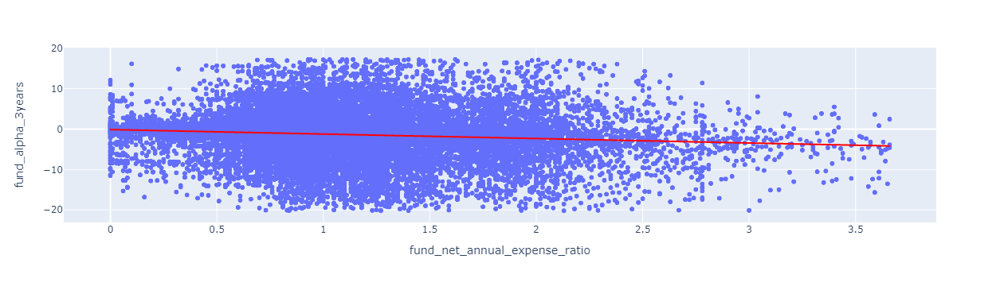

In [44]:
fig = px.scatter(sortedBasedon3YearAlphaTruncated, x='fund_net_annual_expense_ratio', y='fund_alpha_3years', trendline="ols", trendline_color_override='red')
fig.show()